## Advanced lane finding project

### Import libaries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import glob

%matplotlib inline

### Find corners on chessborad calibration images

In [2]:
#Read in a calibration images
images = glob.glob('./camera_cal/calibration*.jpg')


In [3]:
#Arrays to store object points(Distorted points) and image points (undistorted image) from all the images
objpoints = []
imgpoints = []


In [4]:
#prepare object points(6 * 9 =54 ) , like (0,0,0) ,(1,0,0),(2,0,0) ,...... , (8,5,0)
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)    #set x,y coordintaes for object points

In [5]:
objp[0]

array([0., 0., 0.], dtype=float32)

In [6]:
objp[53]

array([8., 5., 0.], dtype=float32)

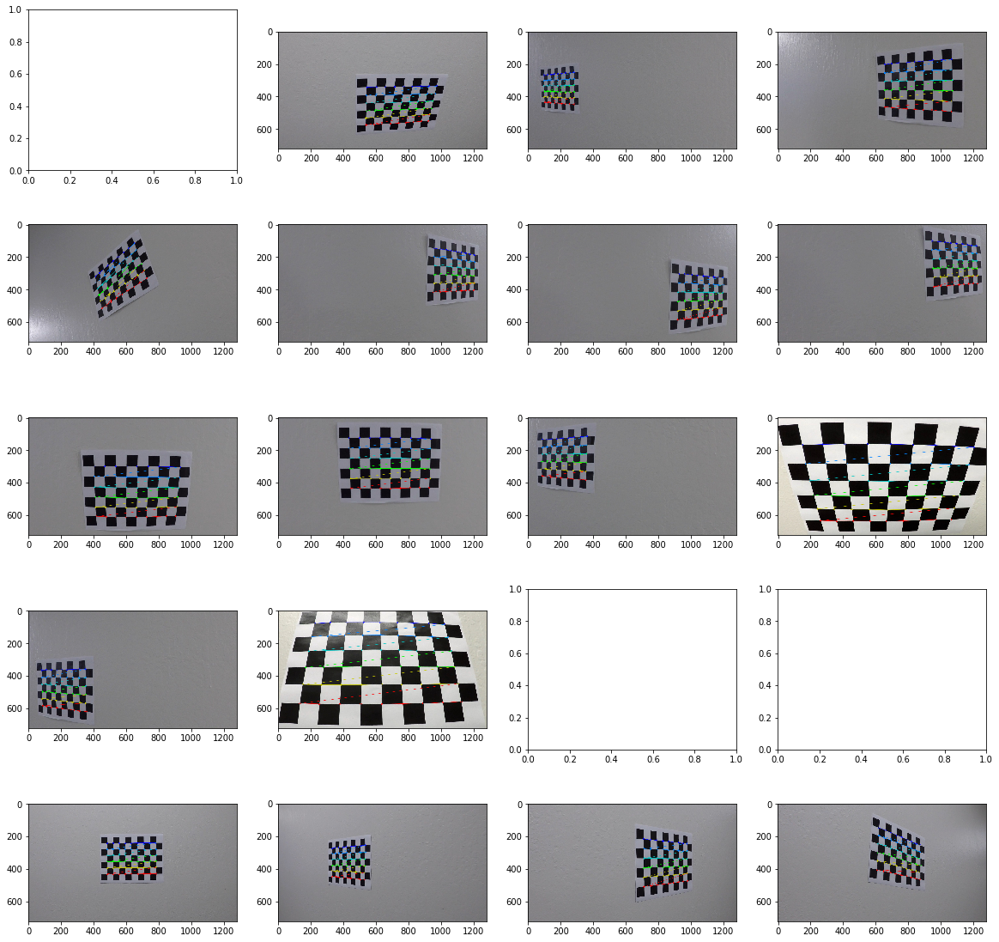

In [7]:
# loop through the claibration images and find corner and display corners on the image./


#prepare subplots to dispaly 20 images:
fig, axs = plt.subplots(5,4,figsize=(20,20))
axs = axs.ravel()

for i,fname in enumerate(images):
    img = mpimg.imread(fname)
    #convert to gray scale
    gray = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    #find chessborad corners
    ret , corners = cv2.findChessboardCorners(gray,(9,6),None)
    #if corner found (ret == True) , add object points , image points
    if ret ==True:
        objpoints.append(objp)
        imgpoints.append(corners)
        #if cornecr found (ret == True) draw and display corners on the image
        img = cv2.drawChessboardCorners(img,(9,6),corners,ret)
        #plt.imshow(img)
        axs[i].imshow(img)
        
        
        
    

### Camera calibarion (find camera matrix and distortion coefficient)

In [8]:
# Do camera calibration given object points and image points

img_size = (img.shape[1], img.shape[0])

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size , None , None)

In [9]:
img_size

(1280, 720)

In [10]:
print('Camera Matrix')
print(mtx)

Camera Matrix
[[1.15662906e+03 0.00000000e+00 6.69041438e+02]
 [0.00000000e+00 1.15169194e+03 3.88137239e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


In [11]:
print('Distortion coefficient K1 , K2 , P1 ,P2 , K3')
print(dist)

Distortion coefficient K1 , K2 , P1 ,P2 , K3
[[-0.23157149 -0.1200054  -0.00118338  0.00023305  0.15641575]]


### Distortion correction

In [12]:
# desfine a fucntion to undistort image
def undist (img , mtx , dist):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

    

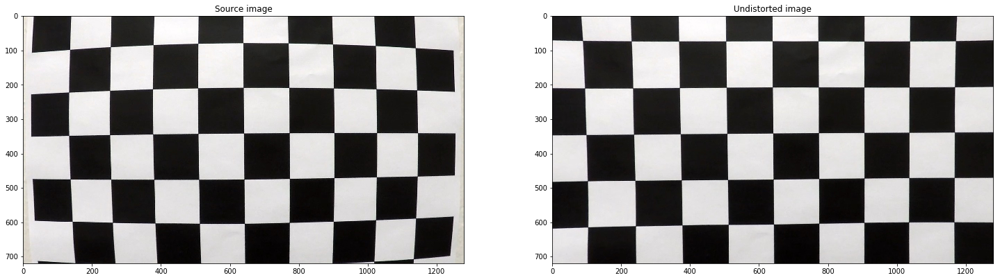

In [13]:
# Test the fucntion on calibration image
fname = './camera_cal\\calibration1.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('Undistorted image')
ax2.imshow(udst)

        

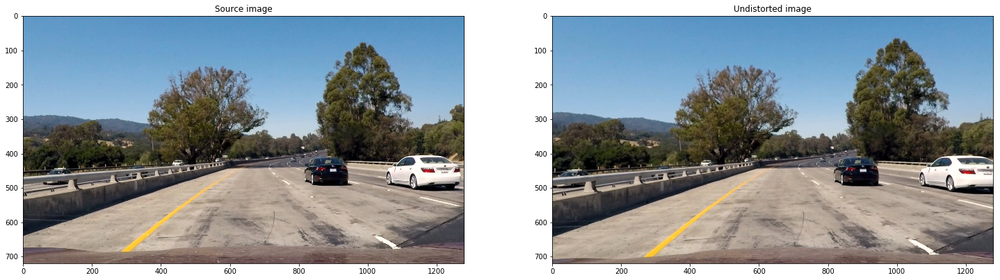

In [14]:
# test the function on test image

fname = './test_images\\test1.jpg'

img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('Undistorted image')
ax2.imshow(udst)


### Gradianet Threshold and Color Threshold

#### Color Threshold

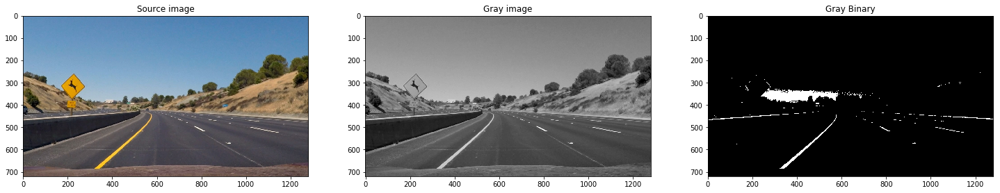

In [15]:
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
thresh=(180,255)

gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
binary = np.zeros_like(gray)
binary[(gray > thresh[0]) & (gray <=thresh[1])]=True


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('Gray image')
ax2.imshow(gray , cmap='gray')

ax3.set_title('Gray Binary')
ax3.imshow(binary , cmap='gray')



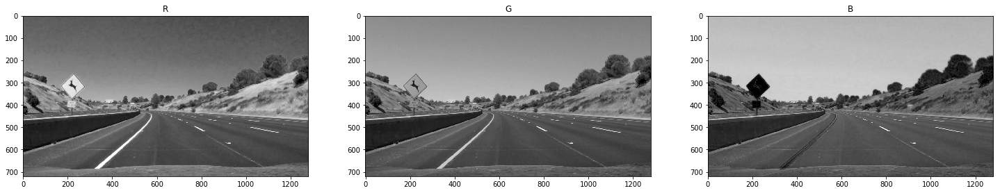

In [16]:
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)

R=img[:,:,0]
G=img[:,:,1]
B=img[:,:,2]


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))

ax1.set_title('R')
ax1.imshow (R , cmap='gray')

ax2.set_title('G')
ax2.imshow(G , cmap='gray')

ax3.set_title('B')
ax3.imshow(B , cmap='gray')

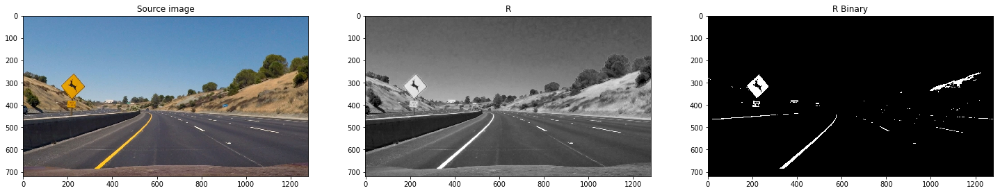

In [17]:

fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
R=img[:,:,0]
thresh=(200,255)

R_binary = np.zeros_like(R)
R_binary[(R > thresh[0]) & (R <=thresh[1])]=True


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('R')
ax2.imshow(R , cmap='gray')

ax3.set_title('R Binary')
ax3.imshow(R_binary ,cmap='gray')

 

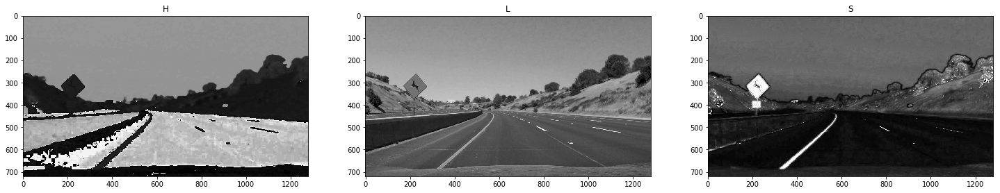

In [18]:
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)  

H=hls[:,:,0]
L=hls[:,:,1]
S=hls[:,:,2]


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))

ax1.set_title('H')
ax1.imshow (H , cmap='gray')

ax2.set_title('L')
ax2.imshow(L , cmap='gray')

ax3.set_title('S')
ax3.imshow(S , cmap='gray')

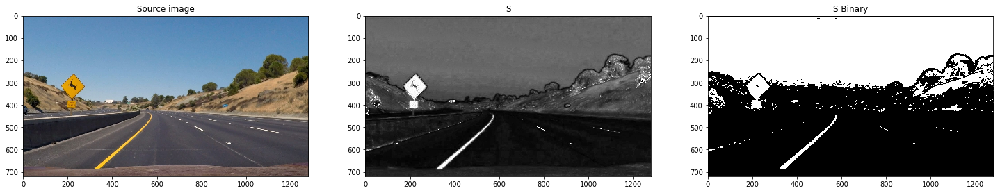

In [19]:
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)  
S=hls[:,:,2]
thresh=(90,255)


S_binary = np.zeros_like(S)
S_binary[(S > thresh[0]) & (S <=thresh[1])]=True


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('S')
ax2.imshow(S , cmap='gray')

ax3.set_title('S Binary')
ax3.imshow(S_binary ,cmap='gray')

#### Gradianet Threshold

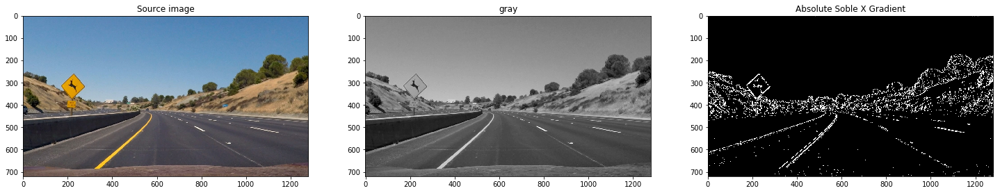

In [20]:
#absolute Sobel X

fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
thresh =(20, 100)

gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))

scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        
x_binary_output = np.zeros_like(scaled_sobel)
    
x_binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))
ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('gray')
ax2.imshow(gray , cmap='gray')

ax3.set_title('Absolute Soble X Gradient')
ax3.imshow(x_binary_output ,cmap='gray')

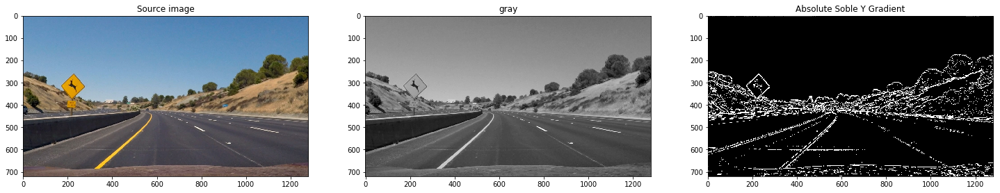

In [21]:
#absolute Sobel Y

fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
thresh =(20, 100)

gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))

scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        
y_binary_output = np.zeros_like(scaled_sobel)
    
y_binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1


f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))
ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('gray')
ax2.imshow(gray , cmap='gray')

ax3.set_title('Absolute Soble Y Gradient')
ax3.imshow(y_binary_output ,cmap='gray')

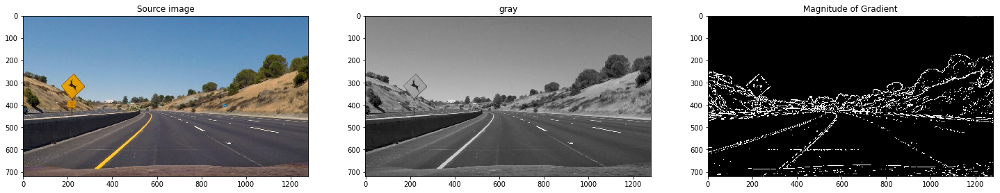

In [22]:
#Magnitude of Gradient

fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
sobel_kernel = 3
mag_thresh =(30, 100)

gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
    
sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    
gradmag = np.sqrt((sobel_x**2)+(sobel_y**2))
    
    
scale_factor = np.max(gradmag)/255 
gradmag = (gradmag/scale_factor).astype(np.uint8) 
    
mag_binary_output = np.zeros_like(gradmag)
mag_binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))
ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('gray')
ax2.imshow(gray , cmap='gray')

ax3.set_title('Magnitude of Gradient')
ax3.imshow(mag_binary_output ,cmap='gray')


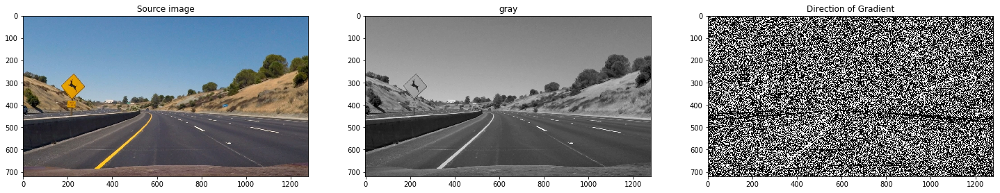

In [23]:
#Direction of Gradient

fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
sobel_kernel = 3
thresh=(0.7, 1.3)

gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)

sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))

dir_binary_output =  np.zeros_like(absgraddir)
dir_binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))
ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('gray')
ax2.imshow(gray , cmap='gray')

ax3.set_title('Direction of Gradient')
ax3.imshow(dir_binary_output ,cmap='gray')
    


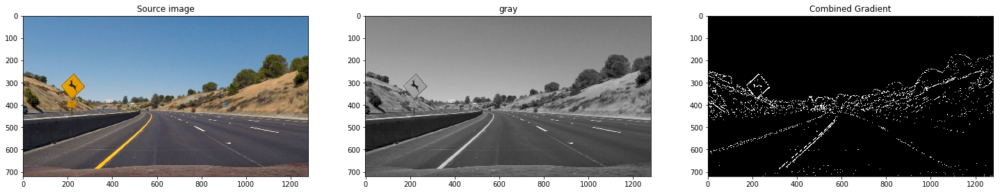

In [24]:
#Combining gradient thershold 
combined = np.zeros_like(dir_binary_output)
combined[((x_binary_output == 1) & (y_binary_output == 1)) | ((mag_binary_output == 1) & (dir_binary_output == 1))] = 1

f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))
ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('gray')
ax2.imshow(gray , cmap='gray')

ax3.set_title('Combined Gradient')
ax3.imshow(combined ,cmap='gray')


### Combine Color and Gradient thresholds

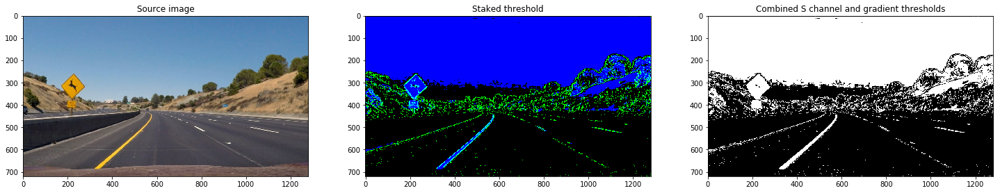

In [25]:
# Combine color and Gradeint thrshold

color_binary = np.dstack(( np.zeros_like(x_binary_output), x_binary_output, S_binary)) * 255

combined_binary = np.zeros_like(x_binary_output)
combined_binary[(S_binary == 1) | (x_binary_output == 1)] = 1

f,(ax1,ax2,ax3) = plt.subplots(1,3 , figsize=(25,10))
ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('Staked threshold')
ax2.imshow(color_binary)

ax3.set_title('Combined S channel and gradient thresholds')
ax3.imshow(combined_binary ,cmap='gray')



In [26]:
#define a function for combined S channel and gradeint thresholds

def com_thr(img, S_thresh=(90,255), x_thresh =(20, 100)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S=hls[:,:,2]
    S_thresh=(90,255)
    S_binary = np.zeros_like(S)
    S_binary[(S > S_thresh[0]) & (S <=S_thresh[1])]=True


    gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    x_binary_output = np.zeros_like(scaled_sobel)
    x_binary_output[(scaled_sobel >= x_thresh[0]) & (scaled_sobel <= x_thresh[1])] = 1


    combined_binary = np.zeros_like(x_binary_output)
    combined_binary[(S_binary == 1) | (x_binary_output == 1)] = 1
    

    return combined_binary





In [27]:
#define a function2 for combined channels and gradeint thresholds (fun2)

def com_thr2(img, S_thresh=(90,255),R_thresh=(200,255), x_thresh =(20,100),y_thresh =(20,100) ,mag_thresh =(30,100),sobel_kernel = 3,d_thresh=(0.7,1.3)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    S=hls[:,:,2]
    S_thresh=(90,255)
    S_binary = np.zeros_like(S)
    S_binary[(S > S_thresh[0]) & (S <=S_thresh[1])]=True

    
    R=img[:,:,0]
    R_binary = np.zeros_like(R)
    R_binary[(R > R_thresh[0]) & (R <=R_thresh[1])]=True

    
    
    gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    x_binary_output = np.zeros_like(scaled_sobel)
    x_binary_output[(scaled_sobel >= x_thresh[0]) & (scaled_sobel <= x_thresh[1])] = 1
    
    
    #gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    y_binary_output = np.zeros_like(scaled_sobel)
    y_binary_output[(scaled_sobel >= y_thresh[0]) & (scaled_sobel <= y_thresh[1])] = 1
    
    
      
    #gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
    sobel_x = cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    gradmag = np.sqrt((sobel_x**2)+(sobel_y**2))
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    mag_binary_output = np.zeros_like(gradmag)
    mag_binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    
    #gray =  cv2.cvtColor(img , cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    dir_binary_output =  np.zeros_like(absgraddir)
    dir_binary_output[(absgraddir >= d_thresh[0]) & (absgraddir <= d_thresh[1])] = 1
    
    
    combined_binary = np.zeros_like(x_binary_output)
     
    #combined_binary[(S_binary==1)|(R_binary==1)|((x_binary_output==1)&(y_binary_output==1))|((mag_binary_output==1)&(dir_binary_output==1))]=1
    combined_binary[(S_binary==1)&(R_binary==1)|((x_binary_output==1)&(y_binary_output==1))|((mag_binary_output==1)&(dir_binary_output==1))]=1
    
    #combined_binary[(S_binary==1)&(R_binary==1)|((x_binary_output==1)|(y_binary_output==1))|((mag_binary_output==1)&(dir_binary_output==1))]=1
         

    

    return combined_binary

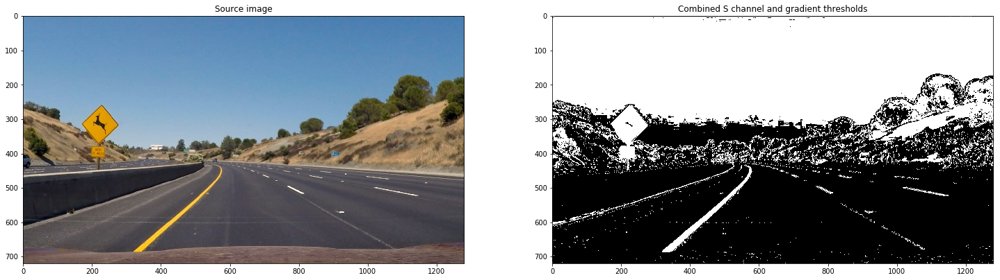

In [28]:
#Test function1
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
combined_binary= com_thr(img)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)


ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(combined_binary ,cmap='gray')


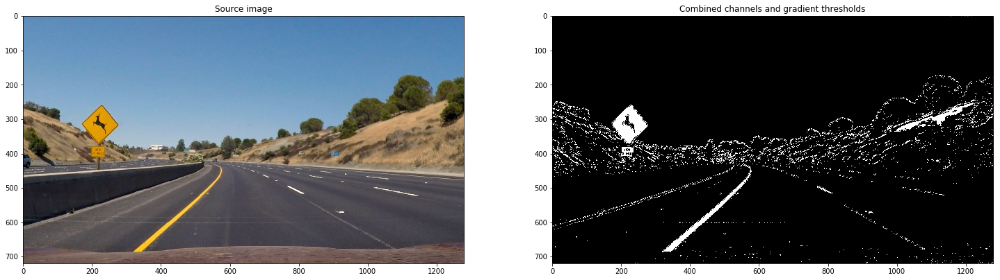

In [29]:
#Test function 2
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
combined_binary= com_thr2(img)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)


ax2.set_title('Combined channels and gradient thresholds')
ax2.imshow(combined_binary ,cmap='gray')

### Perspective Transform

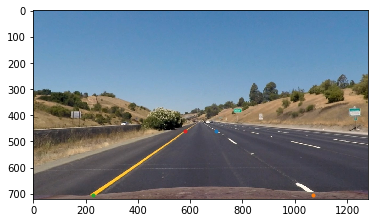

In [30]:
#Load test image
fname = './test_images\\straight_lines1.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
plt.imshow(udst)


# Define 4 points to be used as source point in perspective transform 
plt.plot(700,460,'.') # top right
plt.plot(1070,705,'.') # bottom right
plt.plot(230,705,'.') # bottom left
plt.plot(580,460,'.') # top left




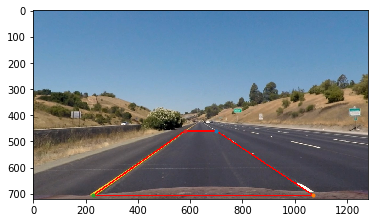

In [31]:
#Load test image
fname = './test_images\\straight_lines1.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)

img_copy = np.copy(udst)



src= np.float32(
        [[700 , 460],
         [1070,705],
         [230,705],
         [580,460]]) 


dst= np.float32(
        [[1070 , 0],
         [1070,705],
         [230,705],
         [230,0]]   
        )

cv2.polylines(img_copy, [np.int32(src)], True, (255, 0, 0), 3)
plt.imshow(img_copy)

# Define 4 points to be used as source point in perspective transform 
plt.plot(700,460,'.') # top right
plt.plot(1070,705,'.') # bottom right
plt.plot(230,705,'.') # bottom left
plt.plot(580,460,'.') # top left



In [32]:
# define warp function to warp an image based on source and det points

def warp(img):
        img_size = (img.shape[1],img.shape[0])
        src= np.float32(
        [[700 , 460],
         [1070,705],
         [230,705],
         [580,460]]   
        )
        
        dst= np.float32(
        [[1070 , 0],
         [1070,705],
         [230,705],
         [230,0]]   
        )
        
        #calulate the perspective matrix M to warp an image
        M=cv2.getPerspectiveTransform(src,dst)
        
        #calulate the perspective inverse matrix Minv to uwared an image        
        Minv=cv2.getPerspectiveTransform(dst,src)
                    
        warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
        unwarped = cv2.warpPerspective(img,Minv,img_size,flags = cv2.INTER_LINEAR)
        
        
        return warped
        
        

In [33]:
def unwarp(img):
        img_size = (img.shape[1],img.shape[0])
        src= np.float32(
        [[700 , 460],
         [1070,705],
         [230,705],
         [580,460]]   
        )
        
        dst= np.float32(
        [[1070 , 0],
         [1070,705],
         [230,705],
         [230,0]]   
        )
        
        #calulate the perspective matrix M to warp an image
        M=cv2.getPerspectiveTransform(src,dst)
        
        #calulate the perspective inverse matrix Minv to uwared an image        
        Minv=cv2.getPerspectiveTransform(dst,src)
                    
        warped = cv2.warpPerspective(img,M,img_size,flags = cv2.INTER_LINEAR)
        unwarped = cv2.warpPerspective(img,Minv,img_size,flags = cv2.INTER_LINEAR)
        
        
        return unwarped


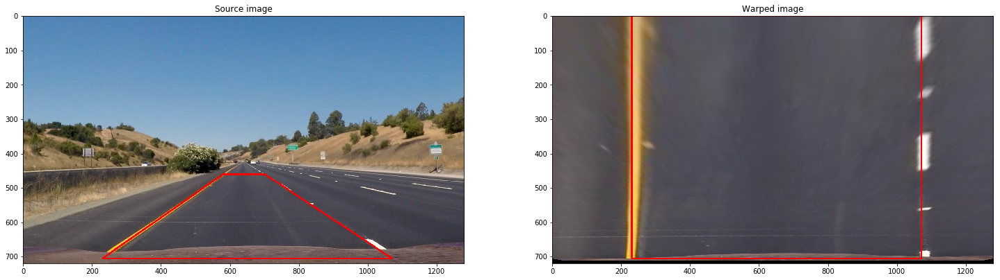

In [34]:
# run the function on test image
fname = './test_images\\straight_lines1.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)


f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

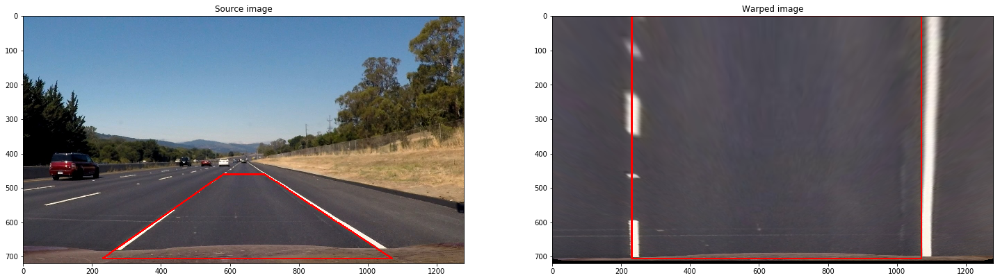

In [35]:
# run the function on test image
fname = './test_images\\straight_lines2.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

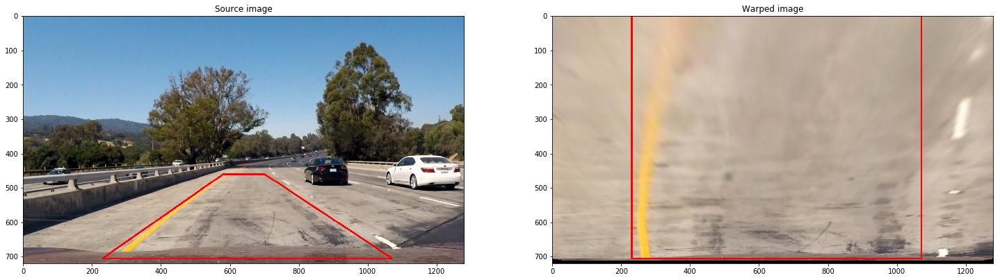

In [36]:
# run the function on test image
fname = './test_images\\test1.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

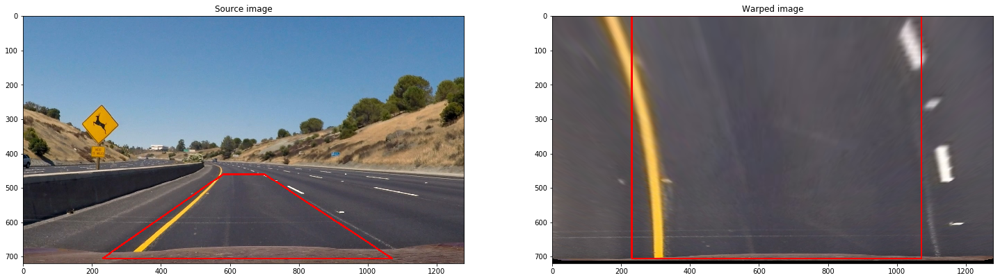

In [37]:
# run the function on test image
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)
f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

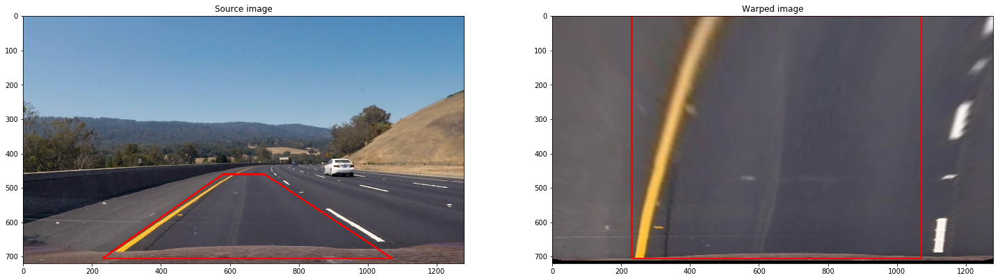

In [38]:
# run the function on test image
fname = './test_images\\test3.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

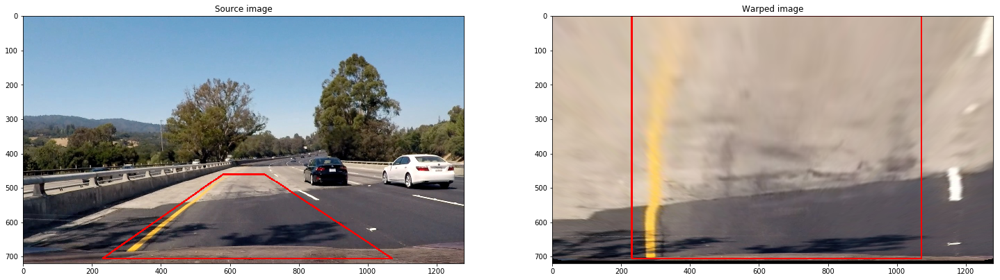

In [39]:
# run the function on test image
fname = './test_images\\test4.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

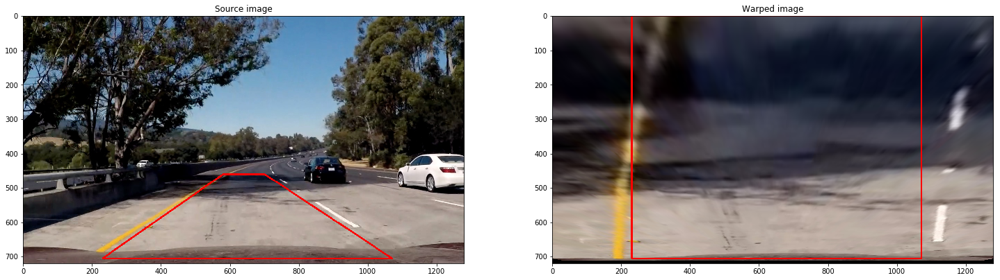

In [40]:
# run the function on test image
fname = './test_images\\test5.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

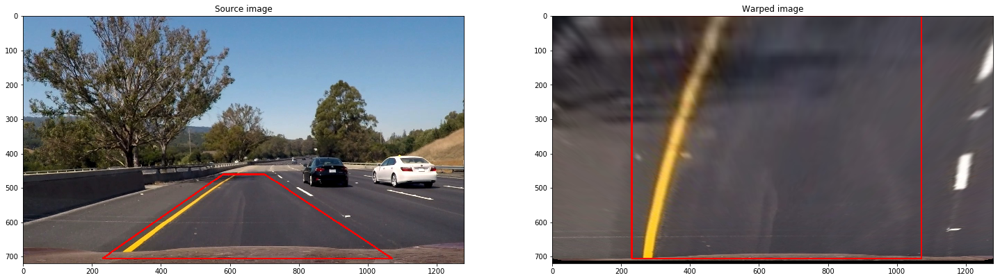

In [41]:
# run the function on test image
fname = './test_images\\test6.jpg'
img = mpimg.imread(fname)
udst = undist(img , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))

cv2.polylines(img, [np.int32(src)], True, (255, 0, 0), 3)
ax1.set_title('Source image')
ax1.imshow (img)

cv2.polylines(warped_img, [np.int32(dst)], True, (255, 0, 0), 3)
ax2.set_title('Warped image')
ax2.imshow(warped_img)

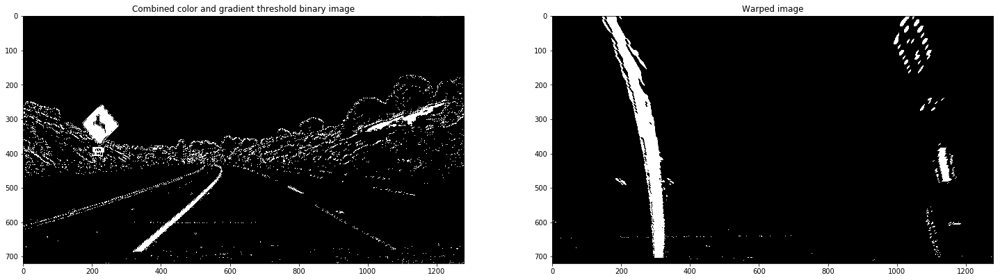

In [42]:
# run the function on combined color and gradient image
fname = './test_images\\test2.jpg'
img = mpimg.imread(fname)
combined_binary =com_thr2(img)
udst = undist(combined_binary , mtx ,dist)
warped_img=warp(udst)

f,(ax1,ax2) = plt.subplots(1,2 , figsize=(25,10))


ax1.set_title('Combined color and gradient threshold binary image')
ax1.imshow (combined_binary,cmap='gray')

ax2.set_title('Warped image')
ax2.imshow(warped_img , cmap='gray')

### Locate the lane lines and fit polynomial

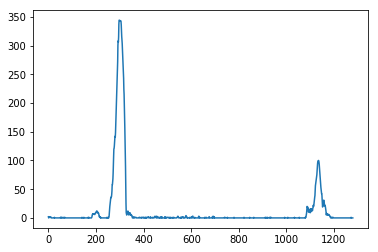

In [43]:
#will save the warped binary image in "binary_warped"
# Take a histogram of the bottom half of the image
binary_warped = warped_img
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
plt.plot(histogram)

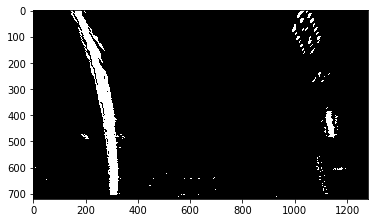

In [44]:
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
plt.imshow(out_img)

In [45]:
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint

In [46]:
# Choose the number of sliding windows
nwindows = 9

In [47]:
# Set height of windows
window_height = np.int(binary_warped.shape[0]//nwindows)

In [48]:
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

In [49]:
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base

In [50]:
# Set the width of the windows +/- margin
margin = 100

In [51]:
# Set minimum number of pixels found to recenter window
minpix = 50

In [52]:
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

In [53]:
# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
    (0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
    (0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
    (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))


In [54]:
# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)


In [55]:
# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

In [56]:
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

(720, 0)

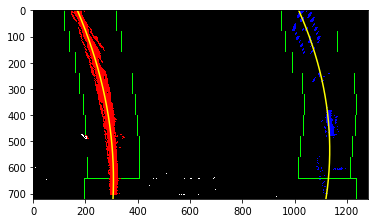

In [57]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [58]:
# Now I have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
left_fit[1]*nonzeroy + left_fit[2] + margin))) 

right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(720, 0)

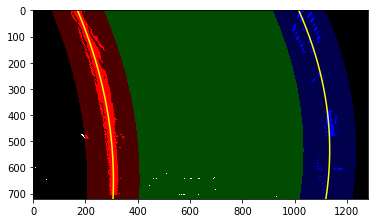

In [59]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))

right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

pts = np.hstack((left_line_window2, right_line_window1))


# Draw the lane onto the warped blank image
 
cv2.fillPoly(window_img, np.int_([pts]), (0,255, 0))    
#cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
#cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([left_line_pts]), (255,0, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,0, 255))


result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

### Create video pipe line

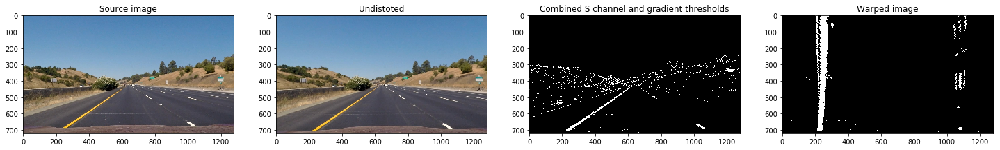

In [60]:
# Test the componenet toghter for the pipeline
#load image
fname = './test_images/straight_lines1.jpg'
img = mpimg.imread(fname)

#undistort image
undt =undist(img , mtx ,dist)

#Color and Gradeint threshold
com_th = com_thr2(undt)

#Perspective Transform
binary_warped =  warp(com_th)


f,(ax1,ax2,ax3,ax4) = plt.subplots(1,4 , figsize=(25,10))

ax1.set_title('Source image')
ax1.imshow (img)

ax2.set_title('Undistoted')
ax2.imshow(undt)

ax3.set_title('Combined S channel and gradient thresholds')
ax3.imshow(com_th ,cmap='gray')

ax4.set_title('Warped image')
ax4.imshow(binary_warped ,cmap='gray')



### The pipeline method 1

In [61]:
#The pipeline method1

def process_image(img):
    #undistort image
    undt =undist(img , mtx ,dist)

    #Color and Gradeint threshold
    com_th = com_thr2(undt)

    #Perspective Transform
    binary_warped =  warp(com_th)
    
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100  
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

     # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
      
    # find line pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))  
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    pts = np.hstack((left_line_window2, right_line_window1))
    
    cv2.fillPoly(window_img, np.int_([pts]), (0,255, 0)) 
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,0, 255))
    #result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    #out_img = unwarp(out_img)
    out_img = unwarp(window_img)
    
      
    #Compute the raduis of curvature of lane
    
    # Define y-value where I want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image (i.e close to car front)
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    #the lane is about 30 meters long and 3.7 meters wide
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700

    # Fit polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    radius_of_curvature = (left_curverad+right_curverad)/2

    # Calculate offset of the car between the lane
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    line_base_pos = (camera_center-out_img.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if line_base_pos <= 0:
        side_pos = 'right'

    # draw the text on the image
    cv2.putText(out_img, 'Radius of Curvature is ' + str(round(radius_of_curvature, 3))+' meters',(50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    cv2.putText(out_img,'Vehicle is '+str(abs(round(line_base_pos,3)))+' meters '+side_pos+' of center',(50,100), cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)

      
             
    #merge the final images
    result = cv2.addWeighted(img, 1, out_img, 0.3, 0)
    
    
    
    return result
    

In [62]:
# test on video

In [63]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [64]:
#Project video
video_output = 'video_output.mp4'
video_input = VideoFileClip("project_video.mp4")
processed_video = video_input.fl_image(process_image)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video video_output.mp4
[MoviePy] Writing video video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [07:50<00:00,  2.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_output.mp4 

Wall time: 7min 52s


In [65]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("video_output.mp4"))

### The pipeline method 2

In [66]:
def findlane1(binary_warped):
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100  
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

     # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    return left_fit,right_fit,left_fitx,right_fitx,out_img

In [67]:
def findlane2(left_fit,right_fit,left_fitx,right_fitx,out_img,binary_warped):
    # Now I have a new warped binary image 
    # from the next frame of video (also called "binary_warped")
    # It's now much easier to find line pixels!
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))  
    
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    
    
    pts = np.hstack((left_line_window2, right_line_window1))
    
    
      

       
    return window_img ,out_img ,pts,left_line_pts,right_line_pts,left_fitx,right_fitx

In [68]:
 #The pipeline method2

def process_image2(img):
    #undistort image
    undt =undist(img , mtx ,dist)

    #Color and Gradeint threshold
    com_th = com_thr2(undt)

    #Perspective Transform
    binary_warped =  warp(com_th)
    
    global framenum
    global left_fit,right_fit,left_fitx,right_fitx,out_img
       
    #If lane line foud skip sliding window
    if (framenum ==1 or framenum%50==0):
        #find lane : sliding window   
        left_fit,right_fit,left_fitx,right_fitx,out_img = findlane1(binary_warped)
    
    # skip sliding window and fit lines
    window_img , out_img ,pts,left_line_pts,right_line_pts,left_fitx,right_fitx  = findlane2(left_fit = left_fit ,right_fit = right_fit ,left_fitx = left_fitx ,right_fitx = right_fitx ,out_img= out_img ,binary_warped=binary_warped)
    
    
    cv2.fillPoly(window_img, np.int_([pts]), (0,255, 0)) 
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (255,0, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,0, 255))
    #result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    #out_img = unwarp(out_img)
    out_img = unwarp(window_img)
    
      
    #Compute the raduis of curvature of lane
    
    # Define y-value where I want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image (i.e close to car front)
    y_eval = np.max(ploty)

    # Define conversions in x and y from pixels space to meters
    #the lane is about 30 meters long and 3.7 meters wide
    ym_per_pix = 30/720
    xm_per_pix = 3.7/700

    # Fit polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    radius_of_curvature = (left_curverad+right_curverad)/2

    # Calculate offset of the car between the lane
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    line_base_pos = (camera_center-out_img.shape[1]/2)*xm_per_pix
    side_pos = 'left'
    if line_base_pos <= 0:
        side_pos = 'right'

    # draw the text on the image
    cv2.putText(out_img, 'Radius of Curvature is ' + str(round(radius_of_curvature, 3))+' meters',(50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255),2)
    cv2.putText(out_img,'Vehicle is '+str(abs(round(line_base_pos,3)))+' meters '+side_pos+' of center',(50,100), cv2.FONT_HERSHEY_SIMPLEX,1,(255,255,255),2)

      
             
    #merge the final images
    result = cv2.addWeighted(img, 1, out_img, 0.3, 0)
     
         
   
    framenum = framenum +1
    
    
    return result

In [69]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [70]:
#Project video test2
left_fit,right_fit,left_fitx,right_fitx=[],[],[],[]
framenum =1
video_output = 'video_output2.mp4'
video_input = VideoFileClip("project_video.mp4")
processed_video = video_input.fl_image(process_image2)
%time processed_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video video_output2.mp4
[MoviePy] Writing video video_output2.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [06:58<00:00,  3.16it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: video_output2.mp4 

Wall time: 7min


In [71]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("video_output2.mp4"))